## HCP individualized connectome prediction evaluation

In [17]:
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
import scipy
import sklearn
from sklearn.decomposition import PCA
import torch
from torch.utils.data import Dataset, DataLoader
from data.data_utils import *


In [18]:
import importlib
import data.hcp_dataset
import data.dataset_utils 
import data.data_utils
importlib.reload(data.hcp_dataset)
importlib.reload(data.dataset_utils)
importlib.reload(data.data_utils)
from data.hcp_dataset import *
from data.dataset_utils import *
from data.data_utils import *
from data.hcp_dataset import HCP_Base, HCP_Partition

import loss
from loss import *

In [19]:
import models
from models import *
from models import CrossModalPCA, CrossModal_PCA_PLS
importlib.reload(models)
from models import *

import importlib
import eval
import eval_utils
importlib.reload(eval)
from eval import *

importlib.reload(eval_utils)
import eval_utils
from eval_utils import *

importlib.reload(data.hcp_dataset)
importlib.reload(data.dataset_utils)
importlib.reload(data.data_utils)
import data 


importlib.reload(loss)
import loss
from loss import *

### Cross-modal (SC-to-FC) PCA naive model

In [20]:
HCP_Dataset = HCP_Base(parcellation="Glasser", shuffle_seed=0, source="SC", target="FC",)

# redefine dataset and loaders
HCP_train = HCP_Partition(HCP_Dataset, "train")
HCP_val = HCP_Partition(HCP_Dataset, "val")
HCP_test = HCP_Partition(HCP_Dataset, "test")
HCP_train_loader = DataLoader(HCP_train, batch_size=256, shuffle=False)
HCP_val_loader = DataLoader(HCP_val, batch_size=256, shuffle=False)
HCP_test_loader = DataLoader(HCP_test, batch_size=256, shuffle=False)

In [21]:
# initialize model
cross_modal_pca_model = CrossModalPCA(HCP_Dataset, num_components=256)

# generate predictions
device = cross_modal_pca_model.device if hasattr(cross_modal_pca_model, 'device') else torch.device("cpu")
train_preds, train_targets = predict_from_loader(cross_modal_pca_model, HCP_train_loader, device=device)
val_preds, val_targets = predict_from_loader(cross_modal_pca_model, HCP_val_loader, device=device)
test_preds, test_targets = predict_from_loader(cross_modal_pca_model, HCP_test_loader, device=device)

Source mean shape: torch.Size([64620])
Source loadings shape: torch.Size([64620, 683])
Target mean shape: torch.Size([64620])
Target loadings shape: torch.Size([64620, 683])


In [22]:
train_evaluator = Evaluator(train_preds, train_targets, HCP_train, HCP_Dataset)
val_evaluator = Evaluator(val_preds, val_targets, HCP_val, HCP_Dataset)
test_evaluator = Evaluator(test_preds, test_targets, HCP_test, HCP_Dataset)


In [23]:
test_evaluator.analyze_results(verbose=True, filepath='/scratch/asr655/neuroinformatics/Conn2Conn/results/naive_cross_PCA_results')

returned noise_preds [[ 0.10335524  0.27345097  0.79338528 ...  0.07845213  0.10779611
   0.357242  ]
 [ 0.19199795  0.47149244  0.6724817  ... -0.13729254 -0.09331816
   0.66529671]
 [ 0.3631452   0.63926439  0.88444674 ... -0.01370379  0.12942167
   0.399605  ]
 ...
 [-0.0823811   0.82869695  1.07752755 ... -0.06908565 -0.0044076
   0.4032794 ]
 [ 0.12395494  0.68586341  0.6269889  ... -0.12566296  0.16673283
   0.53747603]
 [ 0.05569954  0.62698798  0.69579933 ... -0.09271123  0.09947311
   0.36341408]]
returned noise_preds [[ 0.10335524  0.27345097  0.79338528 ...  0.07845213  0.10779611
   0.357242  ]
 [ 0.19199795  0.47149244  0.6724817  ... -0.13729254 -0.09331816
   0.66529671]
 [ 0.3631452   0.63926439  0.88444674 ... -0.01370379  0.12942167
   0.399605  ]
 ...
 [-0.0823811   0.82869695  1.07752755 ... -0.06908565 -0.0044076
   0.4032794 ]
 [ 0.12395494  0.68586341  0.6269889  ... -0.12566296  0.16673283
   0.53747603]
 [ 0.05569954  0.62698798  0.69579933 ... -0.09271123  0.0

{'partition': 'test',
 'n_subjects': 195,
 'base_metrics': {'mse': np.float32(0.015550734),
  'r2': np.float32(-0.17462762),
  'pearson': np.float32(0.8116843),
  'demeaned_pearson': np.float64(0.010410747097445158),
  'avg_rank': np.float64(0.5372781065088758),
  'top1_acc': np.float64(0.0)},
 'heatmaps_raw': {'mean_corr': np.float32(0.8116843),
  'demeaned': False,
  'top1_acc': np.float64(0.0),
  'avg_rank_percentile': np.float64(0.5321499013806706),
  'chance_top1': 0.005128205128205128,
  'chance_avgrank': 0.5,
  'ranklist': [179,
   157,
   45,
   102,
   186,
   55,
   2,
   21,
   131,
   91,
   130,
   89,
   151,
   105,
   48,
   19,
   4,
   34,
   183,
   42,
   128,
   132,
   82,
   46,
   47,
   103,
   132,
   8,
   90,
   178,
   50,
   31,
   153,
   194,
   50,
   89,
   114,
   128,
   87,
   4,
   170,
   181,
   136,
   142,
   70,
   48,
   152,
   29,
   87,
   41,
   136,
   168,
   42,
   16,
   192,
   184,
   168,
   148,
   60,
   54,
   34,
   34,
   13,


### Cross-modal (SC-to-FC) Full PLS model

In [24]:
cross_modal_pls_svd = CrossModal_PLS_SVD(HCP_Dataset, n_components=40)

# generate predictions
device = cross_modal_pls_svd.device if hasattr(cross_modal_pls_svd, 'device') else torch.device("cpu")
train_preds, train_targets = predict_from_loader(cross_modal_pls_svd, HCP_train_loader, device=device)
val_preds, val_targets = predict_from_loader(cross_modal_pls_svd, HCP_val_loader, device=device)
test_preds, test_targets = predict_from_loader(cross_modal_pls_svd, HCP_test_loader, device=device)

Fitting PLS-SVD (implicit): X shape (683, 64620), Y shape (683, 64620)
n_components: 40
Memory-efficient: NOT forming 64620x64620 cross-covariance matrix
Computing top-40 singular vectors via implicit SVD...
Singular values: [6552.05409202 4908.97757604 3330.07000209 2812.27723701 2458.55832047]...
PLS-SVD train R²: 0.2156


In [25]:
train_evaluator = Evaluator(train_preds, train_targets, HCP_train, HCP_Dataset)
val_evaluator = Evaluator(val_preds, val_targets, HCP_val, HCP_Dataset)
test_evaluator = Evaluator(test_preds, test_targets, HCP_test, HCP_Dataset)

Top-1 accuracy: 0.026  (5 of 195 subjects had rank 1) (chance=0.005)
Average rank percentile: 0.658 (chance=0.5)


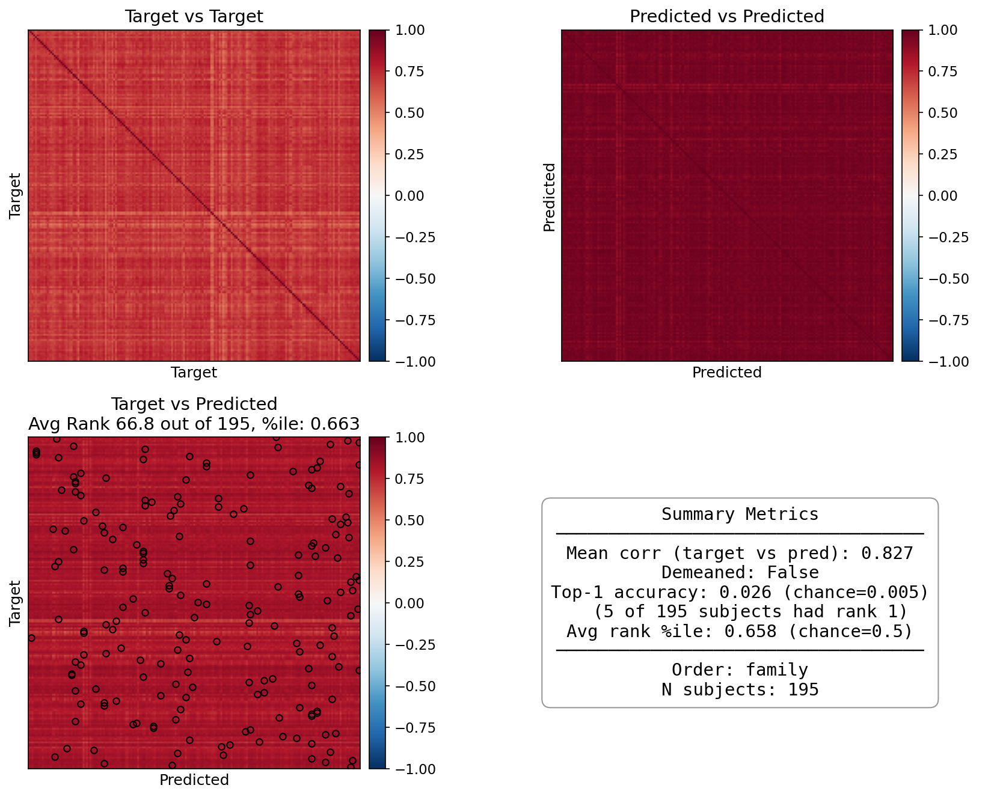

Top-1 accuracy: 0.010  (2 of 195 subjects had rank 1) (chance=0.005)
Average rank percentile: 0.667 (chance=0.5)


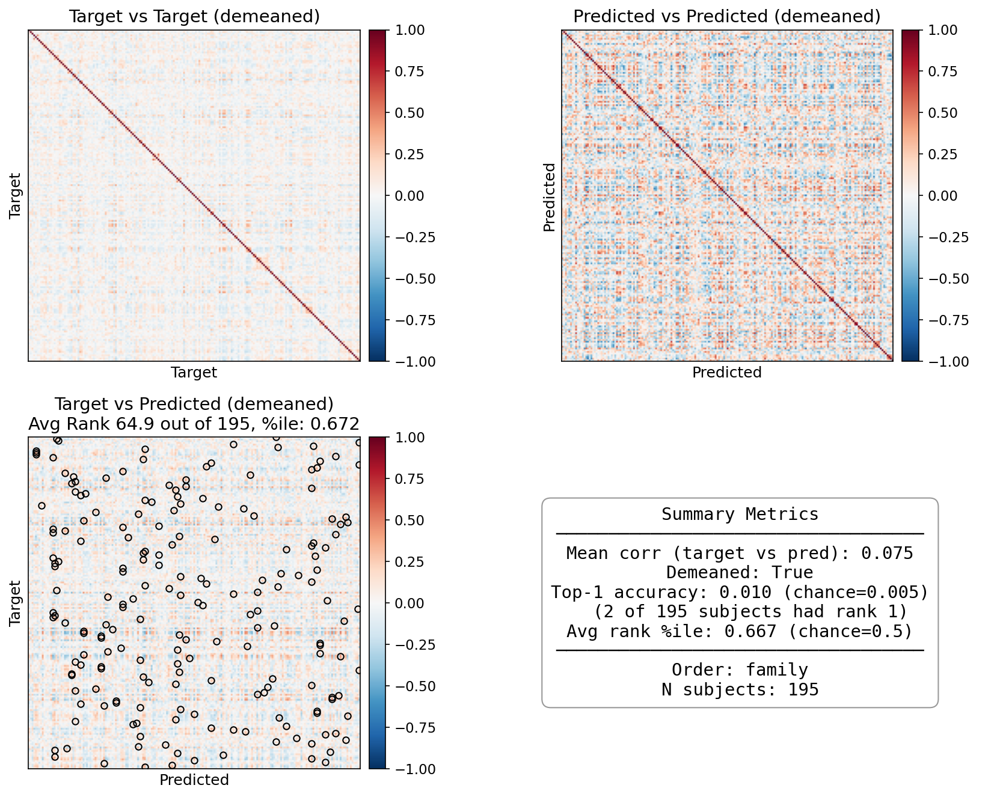

returned noise_preds [[ 0.10335524  0.27345097  0.79338528 ...  0.07845213  0.10779611
   0.357242  ]
 [ 0.19199795  0.47149244  0.6724817  ... -0.13729254 -0.09331816
   0.66529671]
 [ 0.3631452   0.63926439  0.88444674 ... -0.01370379  0.12942167
   0.399605  ]
 ...
 [-0.0823811   0.82869695  1.07752755 ... -0.06908565 -0.0044076
   0.4032794 ]
 [ 0.12395494  0.68586341  0.6269889  ... -0.12566296  0.16673283
   0.53747603]
 [ 0.05569954  0.62698798  0.69579933 ... -0.09271123  0.09947311
   0.36341408]]


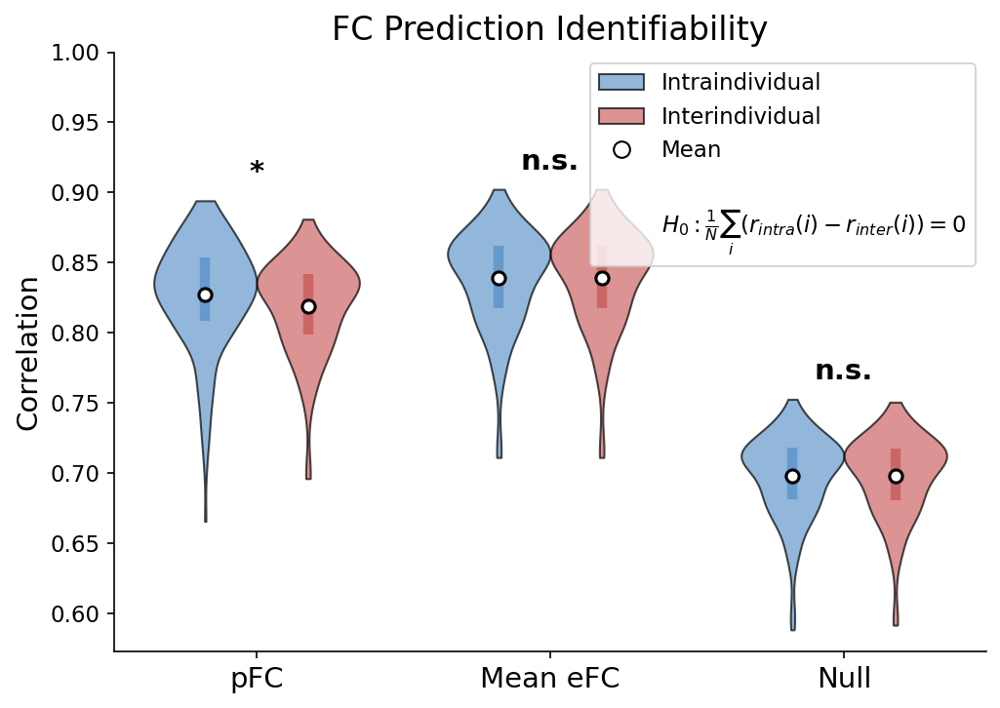


Identifiability Summary:
Condition    r_intra    r_inter    d          t          p            Cohen d   
----------------------------------------------------------------------
pFC          0.8275     0.8189     0.0086     6.44       9.08e-10     0.46      
Mean eFC     0.8390     0.8390     -0.0000    -1.14      2.56e-01     -0.08     
Null         0.6982     0.6980     0.0001     1.13       2.59e-01     0.08      
returned noise_preds [[ 0.10335524  0.27345097  0.79338528 ...  0.07845213  0.10779611
   0.357242  ]
 [ 0.19199795  0.47149244  0.6724817  ... -0.13729254 -0.09331816
   0.66529671]
 [ 0.3631452   0.63926439  0.88444674 ... -0.01370379  0.12942167
   0.399605  ]
 ...
 [-0.0823811   0.82869695  1.07752755 ... -0.06908565 -0.0044076
   0.4032794 ]
 [ 0.12395494  0.68586341  0.6269889  ... -0.12566296  0.16673283
   0.53747603]
 [ 0.05569954  0.62698798  0.69579933 ... -0.09271123  0.09947311
   0.36341408]]


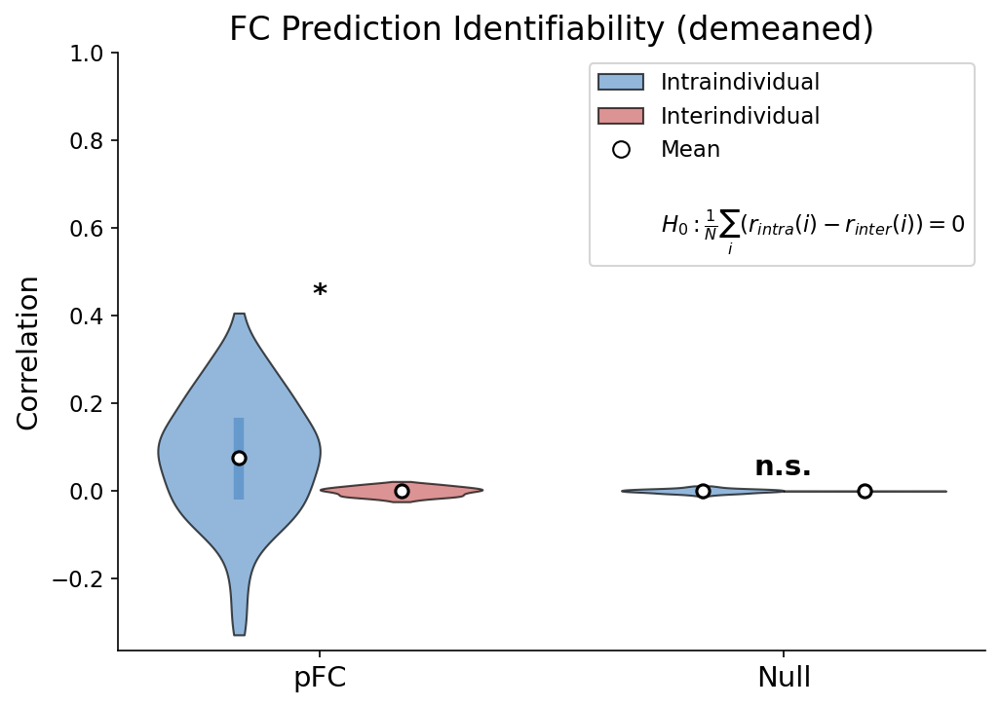


Identifiability Summary:
Condition    r_intra    r_inter    d          t          p            Cohen d   
----------------------------------------------------------------------
pFC          0.0751     -0.0004    0.0755     7.46       2.78e-12     0.53      
Null         0.0004     -0.0001    0.0005     1.35       1.78e-01     0.10      


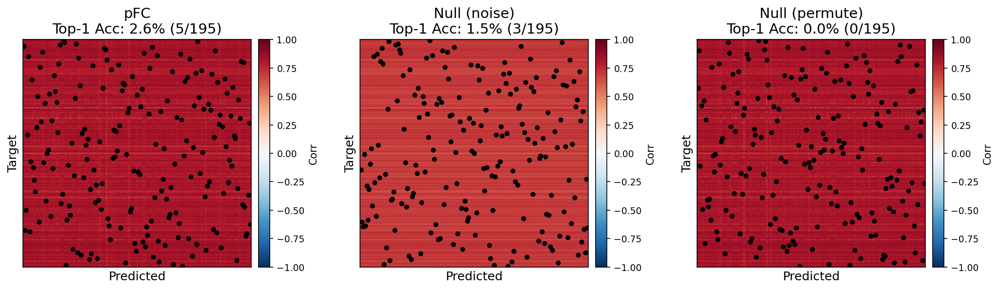

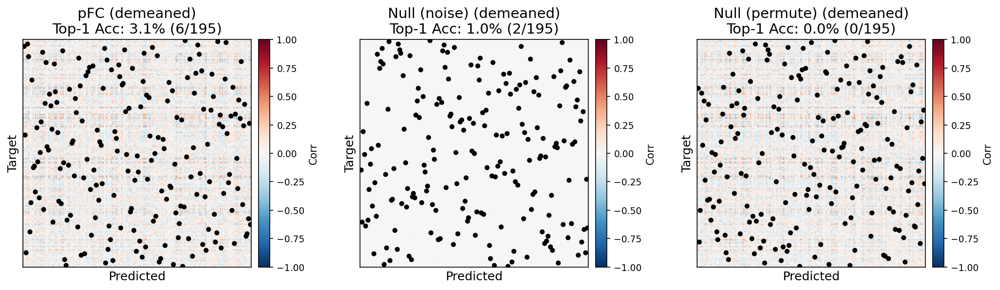

Running Hungarian matching analysis for n=2 to 100 (step=5) with M=1000 iterations...
  n=2: pFC=71.4%, Noise=54.4%, Permute=49.9%
  n=7: pFC=35.8%, Noise=17.8%, Permute=13.9%
  n=12: pFC=26.2%, Noise=10.9%, Permute=8.4%
  n=17: pFC=20.6%, Noise=7.8%, Permute=6.0%
  n=22: pFC=17.0%, Noise=6.4%, Permute=4.7%
  n=27: pFC=15.4%, Noise=5.1%, Permute=3.8%
  n=32: pFC=13.0%, Noise=4.3%, Permute=3.3%
  n=37: pFC=12.0%, Noise=4.0%, Permute=2.7%
  n=42: pFC=11.1%, Noise=3.6%, Permute=2.4%
  n=47: pFC=9.9%, Noise=3.2%, Permute=2.2%
  n=52: pFC=9.4%, Noise=3.1%, Permute=1.8%
  n=57: pFC=8.7%, Noise=2.8%, Permute=1.8%
  n=62: pFC=8.1%, Noise=2.5%, Permute=1.6%
  n=67: pFC=7.8%, Noise=2.4%, Permute=1.5%
  n=72: pFC=7.3%, Noise=2.3%, Permute=1.5%
  n=77: pFC=6.9%, Noise=2.3%, Permute=1.3%
  n=82: pFC=6.4%, Noise=2.1%, Permute=1.2%
  n=87: pFC=6.2%, Noise=2.0%, Permute=1.2%
  n=92: pFC=6.0%, Noise=2.0%, Permute=1.1%
  n=97: pFC=5.7%, Noise=1.8%, Permute=1.0%


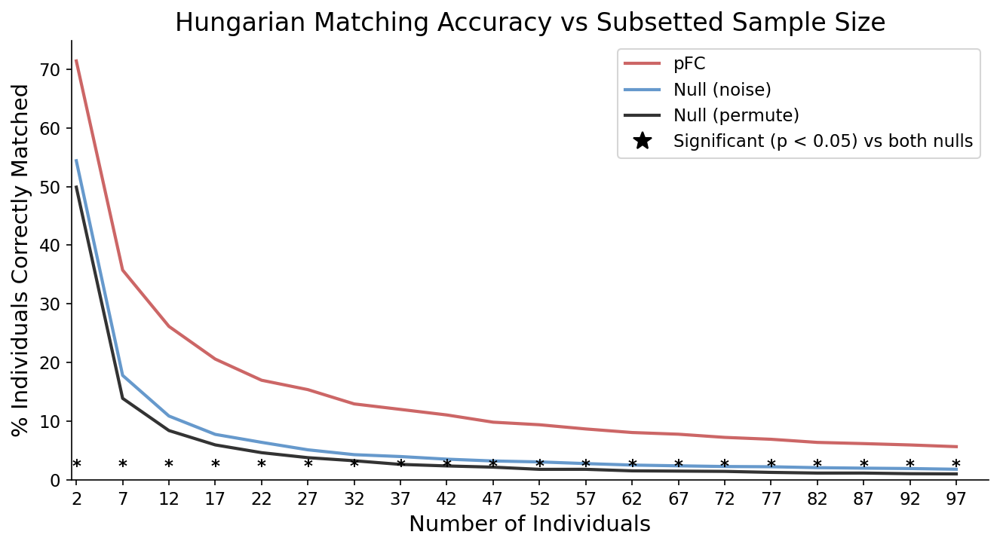


FDR-corrected significance (alpha=0.05):
  pFC vs Null (permute): 20/20 sample sizes significant
  pFC vs Null (noise): 20/20 sample sizes significant
Running Hungarian matching analysis for n=2 to 100 (step=5) with M=1000 iterations...
  n=2: pFC=72.0%, Noise=52.8%, Permute=49.0%
  n=7: pFC=35.5%, Noise=17.4%, Permute=14.5%
  n=12: pFC=25.2%, Noise=11.1%, Permute=8.4%
  n=17: pFC=20.1%, Noise=7.9%, Permute=5.8%
  n=22: pFC=16.6%, Noise=6.5%, Permute=4.8%
  n=27: pFC=15.6%, Noise=5.3%, Permute=3.8%
  n=32: pFC=13.0%, Noise=4.5%, Permute=3.2%
  n=37: pFC=12.1%, Noise=4.3%, Permute=2.7%
  n=42: pFC=11.2%, Noise=3.8%, Permute=2.4%
  n=47: pFC=10.0%, Noise=3.5%, Permute=2.1%
  n=52: pFC=9.4%, Noise=3.4%, Permute=1.9%
  n=57: pFC=8.5%, Noise=3.0%, Permute=1.9%
  n=62: pFC=8.2%, Noise=2.8%, Permute=1.6%
  n=67: pFC=7.7%, Noise=2.7%, Permute=1.5%
  n=72: pFC=7.1%, Noise=2.5%, Permute=1.4%
  n=77: pFC=6.8%, Noise=2.5%, Permute=1.3%
  n=82: pFC=6.5%, Noise=2.3%, Permute=1.2%
  n=87: pFC=6.2%, 

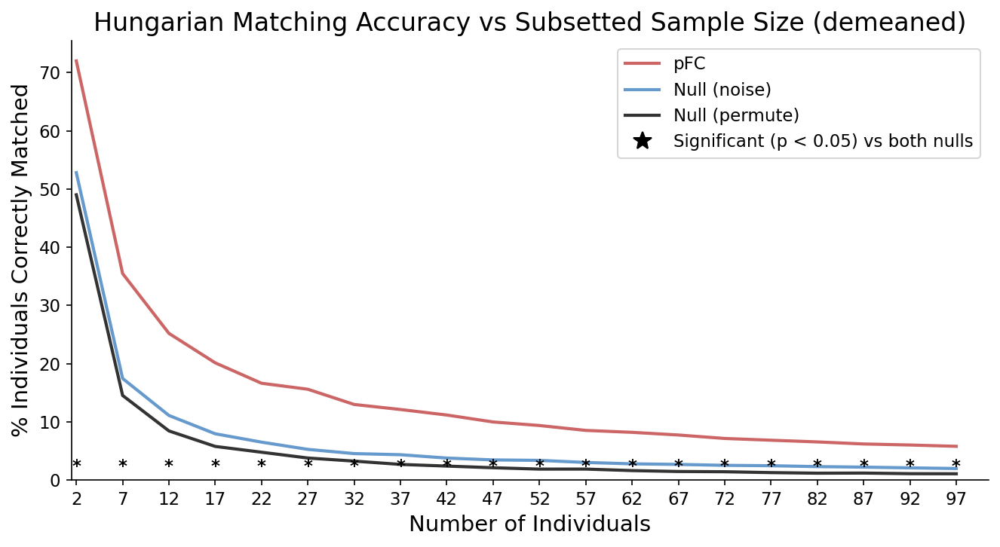


FDR-corrected significance (alpha=0.05):
  pFC vs Null (permute): 20/20 sample sizes significant
  pFC vs Null (noise): 20/20 sample sizes significant


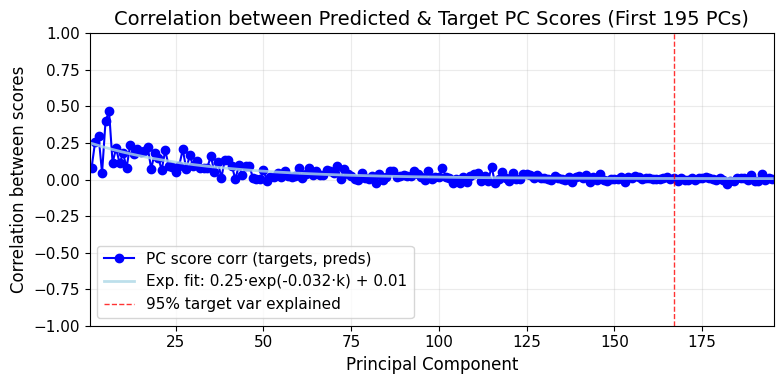

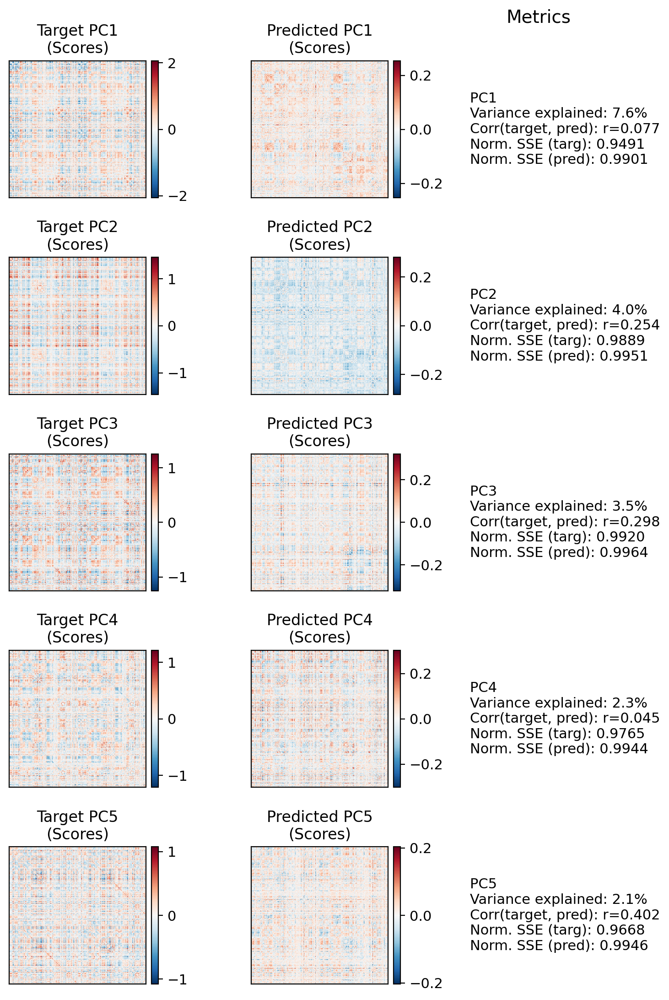

{'partition': 'test',
 'n_subjects': 195,
 'base_metrics': {'mse': np.float32(0.014246114),
  'r2': np.float32(-0.08148038),
  'pearson': np.float32(0.8274719),
  'demeaned_pearson': np.float64(0.07505733250145112),
  'avg_rank': np.float64(0.6627481919789613),
  'top1_acc': np.float64(0.02564102564102564)},
 'heatmaps_raw': {'mean_corr': np.float32(0.82747185),
  'demeaned': False,
  'top1_acc': np.float64(0.02564102564102564),
  'avg_rank_percentile': np.float64(0.6576199868507562),
  'chance_top1': 0.005128205128205128,
  'chance_avgrank': 0.5,
  'ranklist': [113,
   104,
   156,
   77,
   17,
   80,
   127,
   28,
   149,
   43,
   53,
   87,
   19,
   149,
   24,
   177,
   177,
   86,
   89,
   2,
   17,
   4,
   3,
   82,
   47,
   184,
   103,
   1,
   14,
   161,
   31,
   98,
   195,
   5,
   191,
   23,
   184,
   16,
   11,
   79,
   16,
   16,
   39,
   20,
   12,
   26,
   3,
   130,
   146,
   97,
   75,
   167,
   84,
   79,
   57,
   7,
   19,
   23,
   47,
   12,
   3

In [26]:
test_evaluator.analyze_results(verbose=True) #, filepath='/scratch/asr655/neuroinformatics/Conn2Conn/results/cross_PLS_results')

### Cross-modal (SC-to-FC) PCA + PLS Translation model

In [27]:
# initialize model
cross_modal_pca_model = CrossModal_PCA_PLS(HCP_Dataset, n_components_pca=128, n_components_pls=64)

# generate predictions
device = cross_modal_pca_model.device if hasattr(cross_modal_pca_model, 'device') else torch.device("cpu")
train_preds, train_targets = predict_from_loader(cross_modal_pca_model, HCP_train_loader, device=device)
val_preds, val_targets = predict_from_loader(cross_modal_pca_model, HCP_val_loader, device=device)
test_preds, test_targets = predict_from_loader(cross_modal_pca_model, HCP_test_loader, device=device)


/ext3/miniforge3/lib/python3.12/site-packages/sklearn/cross_decomposition/_pls.py:104: ConvergenceWarning: Maximum number of iterations reached
  warnings.warn("Maximum number of iterations reached", ConvergenceWarning)


PLS model fit score:  0.21502082911249265
PCA source scores shape: torch.Size([683, 683])
PLS source scores shape:  (683, 64)
PLS target scores shape:  (683, 64)
PCA target scores shape: torch.Size([683, 683])


In [28]:
train_evaluator = Evaluator(train_preds, train_targets, HCP_train, HCP_Dataset)
val_evaluator = Evaluator(val_preds, val_targets, HCP_val, HCP_Dataset)
test_evaluator = Evaluator(test_preds, test_targets, HCP_test, HCP_Dataset)

In [29]:
test_evaluator.analyze_results(verbose=True, filepath='/scratch/asr655/neuroinformatics/Conn2Conn/results/cross_PCA_PLS_results')

returned noise_preds [[ 0.10335524  0.27345097  0.79338528 ...  0.07845213  0.10779611
   0.357242  ]
 [ 0.19199795  0.47149244  0.6724817  ... -0.13729254 -0.09331816
   0.66529671]
 [ 0.3631452   0.63926439  0.88444674 ... -0.01370379  0.12942167
   0.399605  ]
 ...
 [-0.0823811   0.82869695  1.07752755 ... -0.06908565 -0.0044076
   0.4032794 ]
 [ 0.12395494  0.68586341  0.6269889  ... -0.12566296  0.16673283
   0.53747603]
 [ 0.05569954  0.62698798  0.69579933 ... -0.09271123  0.09947311
   0.36341408]]
returned noise_preds [[ 0.10335524  0.27345097  0.79338528 ...  0.07845213  0.10779611
   0.357242  ]
 [ 0.19199795  0.47149244  0.6724817  ... -0.13729254 -0.09331816
   0.66529671]
 [ 0.3631452   0.63926439  0.88444674 ... -0.01370379  0.12942167
   0.399605  ]
 ...
 [-0.0823811   0.82869695  1.07752755 ... -0.06908565 -0.0044076
   0.4032794 ]
 [ 0.12395494  0.68586341  0.6269889  ... -0.12566296  0.16673283
   0.53747603]
 [ 0.05569954  0.62698798  0.69579933 ... -0.09271123  0.0

{'partition': 'test',
 'n_subjects': 195,
 'base_metrics': {'mse': np.float32(0.013715047),
  'r2': np.float32(-0.0412339),
  'pearson': np.float32(0.83390677),
  'demeaned_pearson': np.float64(0.08554344963525536),
  'avg_rank': np.float64(0.7043786982248521),
  'top1_acc': np.float64(0.05128205128205128)},
 'heatmaps_raw': {'mean_corr': np.float32(0.83390665),
  'demeaned': False,
  'top1_acc': np.float64(0.05128205128205128),
  'avg_rank_percentile': np.float64(0.699250493096647),
  'chance_top1': 0.005128205128205128,
  'chance_avgrank': 0.5,
  'ranklist': [10,
   39,
   53,
   48,
   5,
   122,
   124,
   29,
   61,
   40,
   31,
   45,
   19,
   160,
   7,
   179,
   161,
   133,
   70,
   2,
   8,
   1,
   33,
   109,
   7,
   188,
   187,
   6,
   5,
   106,
   33,
   141,
   190,
   10,
   177,
   38,
   38,
   3,
   42,
   36,
   19,
   3,
   1,
   16,
   21,
   10,
   7,
   120,
   159,
   130,
   71,
   171,
   117,
   48,
   8,
   10,
   6,
   7,
   38,
   4,
   71,
   30,

In [30]:
# test_evaluator.visualize_individual_prediction(idx=3, scale='self')

### Cross-modal (SC-to-FC) PCA-PLS-PCA Learned model

In [31]:
# Initialize model
cross_modal_pca_pls_learnable_model = CrossModal_PCA_PLS_learnable(HCP_Dataset,
                                        n_components_pca_source=256, n_components_pls=8, n_components_pca_target=256,
                                        learn_encoder=False, learn_mid=True, learn_decoder=False,
                                        loss_fn='demeaned_mse', # loss_alpha=0.5,
                                        random_init=False,
                                        dropout=0.2, l1_reg=0.00, l2_reg=0.0001,
                                        epochs=300, lr=.0001)

/ext3/miniforge3/lib/python3.12/site-packages/sklearn/cross_decomposition/_pls.py:104: ConvergenceWarning: Maximum number of iterations reached
  warnings.warn("Maximum number of iterations reached", ConvergenceWarning)


Init: enc:pca/pls(frozen), mid:pca/pls, dec:pca/pls(frozen)
Shapes: enc=(64620, 256), mid=(256, 256), dec=(256, 64620)


Training on cuda
Model parameters: 65,536
Loss: demeaned_mse | Reg: L1=0.0, L2=0.0001
Epochs: 300, LR: 0.0001
Logging every 5 epochs

Epoch    1 | Train MSE: 0.013227, r: 0.8407, r_dm: 0.1822 | Val MSE: 0.014248, r: 0.8316, r_dm: 0.0829 | 1.30s | GPU: 2050MB


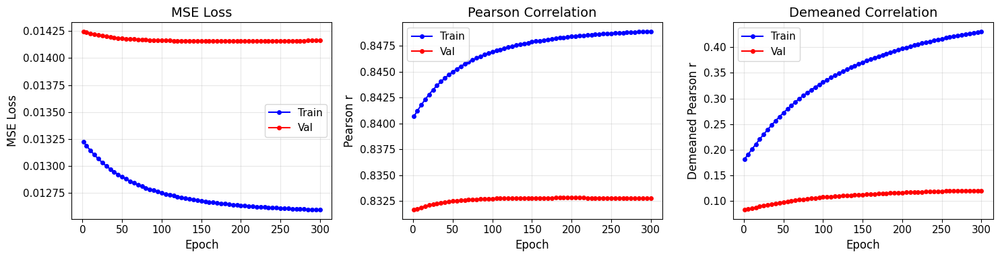

Epoch    5 | Train MSE: 0.013189, r: 0.8412, r_dm: 0.1905 | Val MSE: 0.014239, r: 0.8317, r_dm: 0.0844 | 0.01s | GPU: 2050MB
Epoch   10 | Train MSE: 0.013145, r: 0.8418, r_dm: 0.2009 | Val MSE: 0.014229, r: 0.8319, r_dm: 0.0862 | 0.01s | GPU: 2050MB
Epoch   15 | Train MSE: 0.013104, r: 0.8423, r_dm: 0.2111 | Val MSE: 0.014221, r: 0.8320, r_dm: 0.0880 | 0.01s | GPU: 2050MB
Epoch   20 | Train MSE: 0.013067, r: 0.8428, r_dm: 0.2209 | Val MSE: 0.014213, r: 0.8321, r_dm: 0.0897 | 0.01s | GPU: 2050MB
Epoch   25 | Train MSE: 0.013033, r: 0.8433, r_dm: 0.2304 | Val MSE: 0.014206, r: 0.8322, r_dm: 0.0914 | 0.01s | GPU: 2050MB
Epoch   30 | Train MSE: 0.013002, r: 0.8437, r_dm: 0.2396 | Val MSE: 0.014200, r: 0.8322, r_dm: 0.0930 | 0.01s | GPU: 2050MB
Epoch   35 | Train MSE: 0.012973, r: 0.8440, r_dm: 0.2483 | Val MSE: 0.014195, r: 0.8323, r_dm: 0.0944 | 0.01s | GPU: 2050MB
Epoch   40 | Train MSE: 0.012947, r: 0.8444, r_dm: 0.2567 | Val MSE: 0.014191, r: 0.8324, r_dm: 0.0958 | 0.01s | GPU: 2050MB


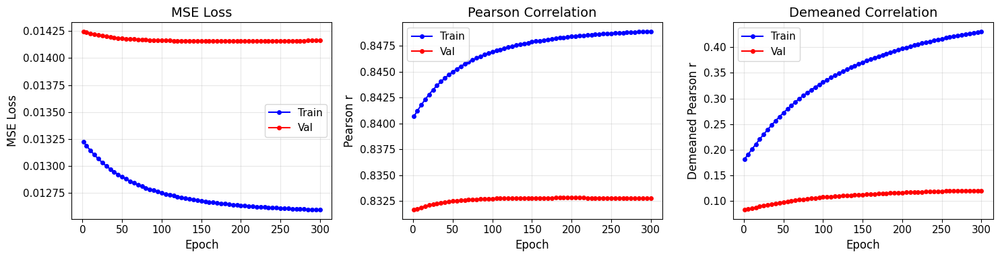

In [32]:
logger = train_model(
    cross_modal_pca_pls_learnable_model,
    HCP_train_loader,
    HCP_val_loader,
    base=HCP_Dataset,
    log_every=5
)

In [33]:
# generate predictions
device = cross_modal_pca_pls_learnable_model.device if hasattr(cross_modal_pca_pls_learnable_model, 'device') else torch.device("cpu")
train_preds, train_targets = predict_from_loader(cross_modal_pca_pls_learnable_model, HCP_train_loader, device=device)
val_preds, val_targets = predict_from_loader(cross_modal_pca_pls_learnable_model, HCP_val_loader, device=device)
test_preds, test_targets = predict_from_loader(cross_modal_pls_svd, HCP_test_loader, device=device)

In [34]:
train_evaluator = Evaluator(train_preds, train_targets, HCP_train, HCP_Dataset)
val_evaluator = Evaluator(val_preds, val_targets, HCP_val, HCP_Dataset)
test_evaluator = Evaluator(test_preds, test_targets, HCP_test, HCP_Dataset)

In [35]:
test_evaluator.analyze_results(verbose=True, filepath='/scratch/asr655/neuroinformatics/Conn2Conn/results/cross_PCA_PLS_learnable_results')

returned noise_preds [[ 0.10335524  0.27345097  0.79338528 ...  0.07845213  0.10779611
   0.357242  ]
 [ 0.19199795  0.47149244  0.6724817  ... -0.13729254 -0.09331816
   0.66529671]
 [ 0.3631452   0.63926439  0.88444674 ... -0.01370379  0.12942167
   0.399605  ]
 ...
 [-0.0823811   0.82869695  1.07752755 ... -0.06908565 -0.0044076
   0.4032794 ]
 [ 0.12395494  0.68586341  0.6269889  ... -0.12566296  0.16673283
   0.53747603]
 [ 0.05569954  0.62698798  0.69579933 ... -0.09271123  0.09947311
   0.36341408]]
returned noise_preds [[ 0.10335524  0.27345097  0.79338528 ...  0.07845213  0.10779611
   0.357242  ]
 [ 0.19199795  0.47149244  0.6724817  ... -0.13729254 -0.09331816
   0.66529671]
 [ 0.3631452   0.63926439  0.88444674 ... -0.01370379  0.12942167
   0.399605  ]
 ...
 [-0.0823811   0.82869695  1.07752755 ... -0.06908565 -0.0044076
   0.4032794 ]
 [ 0.12395494  0.68586341  0.6269889  ... -0.12566296  0.16673283
   0.53747603]
 [ 0.05569954  0.62698798  0.69579933 ... -0.09271123  0.0

{'partition': 'test',
 'n_subjects': 195,
 'base_metrics': {'mse': np.float32(0.014246114),
  'r2': np.float32(-0.08148038),
  'pearson': np.float32(0.8274719),
  'demeaned_pearson': np.float64(0.07505733250145112),
  'avg_rank': np.float64(0.6627481919789613),
  'top1_acc': np.float64(0.02564102564102564)},
 'heatmaps_raw': {'mean_corr': np.float32(0.82747185),
  'demeaned': False,
  'top1_acc': np.float64(0.02564102564102564),
  'avg_rank_percentile': np.float64(0.6576199868507562),
  'chance_top1': 0.005128205128205128,
  'chance_avgrank': 0.5,
  'ranklist': [113,
   104,
   156,
   77,
   17,
   80,
   127,
   28,
   149,
   43,
   53,
   87,
   19,
   149,
   24,
   177,
   177,
   86,
   89,
   2,
   17,
   4,
   3,
   82,
   47,
   184,
   103,
   1,
   14,
   161,
   31,
   98,
   195,
   5,
   191,
   23,
   184,
   16,
   11,
   79,
   16,
   16,
   39,
   20,
   12,
   26,
   3,
   130,
   146,
   97,
   75,
   167,
   84,
   79,
   57,
   7,
   19,
   23,
   47,
   12,
   3

### Cross-modal (SC-to-FC) Krakencoder model

In [36]:
from scipy.io import loadmat

# --- Load predicted .mat and set source parcellation/conn type ---
parcellation = 'Glasser'
conn_type = 'SC' # Source conn type

### TRUE DATA
mat = loadmat('./krakencoder/example_data/mydata_Glasser_inputs.mat')
conndata_Glasser = {}
for ckey in ['FCcorr_Glasser_hpf', 'SCifod2act_Glasser_volnorm']:
    cell_array = mat[ckey]['data'][0][0][0]  # shape: (1, 957), each cell is 360x360
    nsubj = cell_array.shape[0]
    arr3d = np.stack([cell_array[i] for i in range(nsubj)], axis=0)  # (957, 360, 360)

    # Flatten each subject's matrix into upper triangle (excluding diagonal) using square2tri
    data_tri = np.stack([square2tri(arr3d[i], k=1) for i in range(arr3d.shape[0])], axis=0)  # (957, n_edges)
    conndata_Glasser[ckey] = {'data': data_tri}
    print("conndata[%r]['data'] shape:" % ckey, conndata_Glasser[ckey]['data'].shape)

### KRAKEN PREDICTIONS
matfile = loadmat(f"./krakencoder/example_data/mydata_kraken_source_{parcellation}.{conn_type}.mat")
outputtypes = matfile['outputtypes']
predicted_alltypes = matfile['predicted_alltypes']

headers = [
    'FCcorr_Glasser_hpf',
    'FCcorr_4S456Parcels_hpf',
    'SCifod2act_Glasser_volnorm',
    'SCifod2act_4S456Parcels_volnorm'
]

preds = predicted_alltypes[0][0][0][0][0]

# Grab Glasser predictions
predicted_alltypes_Glasser = {
    'FCcorr_Glasser_hpf':    {'data': np.array(preds[1])},
    'SCifod2act_Glasser_volnorm': {'data': np.array(preds[3])}
}

kraken_preds = predicted_alltypes_Glasser['FCcorr_Glasser_hpf']['data']
kraken_train_preds = kraken_preds[HCP_Dataset.trainvaltest_partition_indices['train']]
kraken_val_preds = kraken_preds[HCP_Dataset.trainvaltest_partition_indices['val']]
kraken_test_preds = kraken_preds[HCP_Dataset.trainvaltest_partition_indices['test']]

conndata['FCcorr_Glasser_hpf']['data'] shape: (957, 64620)
conndata['SCifod2act_Glasser_volnorm']['data'] shape: (957, 64620)


In [37]:
train_evaluator = Evaluator(kraken_train_preds, train_targets, HCP_train, HCP_Dataset)
val_evaluator = Evaluator(kraken_val_preds, val_targets, HCP_val, HCP_Dataset)
test_evaluator = Evaluator(kraken_test_preds, test_targets, HCP_test, HCP_Dataset)

In [38]:
test_evaluator.analyze_results(verbose=True, filepath='/scratch/asr655/neuroinformatics/Conn2Conn/results/kraken_results')

returned noise_preds [[ 0.10335524  0.27345097  0.79338528 ...  0.07845213  0.10779611
   0.357242  ]
 [ 0.19199795  0.47149244  0.6724817  ... -0.13729254 -0.09331816
   0.66529671]
 [ 0.3631452   0.63926439  0.88444674 ... -0.01370379  0.12942167
   0.399605  ]
 ...
 [-0.0823811   0.82869695  1.07752755 ... -0.06908565 -0.0044076
   0.4032794 ]
 [ 0.12395494  0.68586341  0.6269889  ... -0.12566296  0.16673283
   0.53747603]
 [ 0.05569954  0.62698798  0.69579933 ... -0.09271123  0.09947311
   0.36341408]]
returned noise_preds [[ 0.10335524  0.27345097  0.79338528 ...  0.07845213  0.10779611
   0.357242  ]
 [ 0.19199795  0.47149244  0.6724817  ... -0.13729254 -0.09331816
   0.66529671]
 [ 0.3631452   0.63926439  0.88444674 ... -0.01370379  0.12942167
   0.399605  ]
 ...
 [-0.0823811   0.82869695  1.07752755 ... -0.06908565 -0.0044076
   0.4032794 ]
 [ 0.12395494  0.68586341  0.6269889  ... -0.12566296  0.16673283
   0.53747603]
 [ 0.05569954  0.62698798  0.69579933 ... -0.09271123  0.0

{'partition': 'test',
 'n_subjects': 195,
 'base_metrics': {'mse': np.float32(0.013571207),
  'r2': np.float32(-0.031421516),
  'pearson': np.float32(0.8358165),
  'demeaned_pearson': np.float64(0.08288907061393067),
  'avg_rank': np.float64(0.7422485207100591),
  'top1_acc': np.float64(0.041025641025641026)},
 'heatmaps_raw': {'mean_corr': np.float32(0.8358165),
  'demeaned': False,
  'top1_acc': np.float64(0.041025641025641026),
  'avg_rank_percentile': np.float64(0.737120315581854),
  'chance_top1': 0.005128205128205128,
  'chance_avgrank': 0.5,
  'ranklist': [28,
   39,
   81,
   47,
   5,
   94,
   143,
   30,
   150,
   56,
   7,
   32,
   7,
   110,
   2,
   167,
   186,
   58,
   75,
   1,
   21,
   1,
   8,
   97,
   24,
   183,
   55,
   14,
   41,
   163,
   8,
   45,
   173,
   2,
   128,
   7,
   20,
   5,
   37,
   93,
   2,
   6,
   6,
   73,
   26,
   31,
   2,
   123,
   159,
   105,
   103,
   127,
   32,
   45,
   10,
   11,
   22,
   6,
   38,
   4,
   37,
   25,
  

### PCA (FC-to-FC) Autoencoder model (256 components)

In [39]:
### PCA (FC-to-FC) Autoencoder model (256 components)
HCP_Dataset = HCP_Base(parcellation="Glasser", shuffle_seed=0, source="FC", target="FC")

# Redefine dataset and loaders
HCP_train = HCP_Partition(HCP_Dataset, "train")
HCP_val = HCP_Partition(HCP_Dataset, "val")
HCP_test = HCP_Partition(HCP_Dataset, "test")
HCP_train_loader = DataLoader(HCP_train, batch_size=256, shuffle=False)
HCP_val_loader = DataLoader(HCP_val, batch_size=256, shuffle=False)
HCP_test_loader = DataLoader(HCP_test, batch_size=256, shuffle=False)

# initialize model
cross_modal_pca_model = CrossModalPCA(HCP_Dataset, num_components=512)

# generate predictions
device = cross_modal_pca_model.device if hasattr(cross_modal_pca_model, 'device') else torch.device("cpu")
train_preds, train_targets = predict_from_loader(cross_modal_pca_model, HCP_train_loader, device=device)
val_preds, val_targets = predict_from_loader(cross_modal_pca_model, HCP_val_loader, device=device)
test_preds, test_targets = predict_from_loader(cross_modal_pca_model, HCP_test_loader, device=device)

Source mean shape: torch.Size([64620])
Source loadings shape: torch.Size([64620, 683])
Target mean shape: torch.Size([64620])
Target loadings shape: torch.Size([64620, 683])


In [40]:
train_evaluator = Evaluator(train_preds, train_targets, HCP_train, HCP_Dataset)
val_evaluator = Evaluator(val_preds, val_targets, HCP_val, HCP_Dataset)
test_evaluator = Evaluator(test_preds, test_targets, HCP_test, HCP_Dataset)

In [41]:
test_evaluator.analyze_results(verbose=True, filepath='/scratch/asr655/neuroinformatics/Conn2Conn/results/self_PCA_results')

returned noise_preds [[ 0.10335524  0.27345097  0.79338528 ...  0.07845213  0.10779611
   0.357242  ]
 [ 0.19199795  0.47149244  0.6724817  ... -0.13729254 -0.09331816
   0.66529671]
 [ 0.3631452   0.63926439  0.88444674 ... -0.01370379  0.12942167
   0.399605  ]
 ...
 [-0.0823811   0.82869695  1.07752755 ... -0.06908565 -0.0044076
   0.4032794 ]
 [ 0.12395494  0.68586341  0.6269889  ... -0.12566296  0.16673283
   0.53747603]
 [ 0.05569954  0.62698798  0.69579933 ... -0.09271123  0.09947311
   0.36341408]]
returned noise_preds [[ 0.10335524  0.27345097  0.79338528 ...  0.07845213  0.10779611
   0.357242  ]
 [ 0.19199795  0.47149244  0.6724817  ... -0.13729254 -0.09331816
   0.66529671]
 [ 0.3631452   0.63926439  0.88444674 ... -0.01370379  0.12942167
   0.399605  ]
 ...
 [-0.0823811   0.82869695  1.07752755 ... -0.06908565 -0.0044076
   0.4032794 ]
 [ 0.12395494  0.68586341  0.6269889  ... -0.12566296  0.16673283
   0.53747603]
 [ 0.05569954  0.62698798  0.69579933 ... -0.09271123  0.0

/ext3/miniforge3/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:579: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


  n=17: pFC=100.0%, Noise=7.8%, Permute=5.6%
  n=22: pFC=100.0%, Noise=6.4%, Permute=4.8%
  n=27: pFC=100.0%, Noise=5.1%, Permute=3.7%
  n=32: pFC=100.0%, Noise=4.3%, Permute=3.2%
  n=37: pFC=100.0%, Noise=4.0%, Permute=2.7%
  n=42: pFC=100.0%, Noise=3.6%, Permute=2.5%
  n=47: pFC=100.0%, Noise=3.2%, Permute=2.2%
  n=52: pFC=100.0%, Noise=3.1%, Permute=2.0%
  n=57: pFC=100.0%, Noise=2.8%, Permute=1.8%
  n=62: pFC=100.0%, Noise=2.5%, Permute=1.6%
  n=67: pFC=100.0%, Noise=2.4%, Permute=1.5%
  n=72: pFC=100.0%, Noise=2.3%, Permute=1.4%
  n=77: pFC=100.0%, Noise=2.3%, Permute=1.3%
  n=82: pFC=100.0%, Noise=2.1%, Permute=1.1%
  n=87: pFC=100.0%, Noise=2.0%, Permute=1.2%
  n=92: pFC=100.0%, Noise=2.0%, Permute=1.1%
  n=97: pFC=100.0%, Noise=1.8%, Permute=1.0%
Running Hungarian matching analysis for n=2 to 100 (step=5) with M=1000 iterations...
  n=2: pFC=100.0%, Noise=52.8%, Permute=47.1%
  n=7: pFC=100.0%, Noise=17.4%, Permute=14.0%
  n=12: pFC=100.0%, Noise=11.1%, Permute=8.5%
  n=17: pFC

/ext3/miniforge3/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:579: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


  n=22: pFC=100.0%, Noise=6.5%, Permute=4.8%
  n=27: pFC=100.0%, Noise=5.3%, Permute=3.7%
  n=32: pFC=100.0%, Noise=4.5%, Permute=3.2%
  n=37: pFC=100.0%, Noise=4.3%, Permute=2.7%
  n=42: pFC=100.0%, Noise=3.8%, Permute=2.5%
  n=47: pFC=100.0%, Noise=3.5%, Permute=2.2%
  n=52: pFC=100.0%, Noise=3.4%, Permute=2.0%
  n=57: pFC=100.0%, Noise=3.0%, Permute=1.8%
  n=62: pFC=100.0%, Noise=2.8%, Permute=1.6%
  n=67: pFC=100.0%, Noise=2.7%, Permute=1.5%
  n=72: pFC=100.0%, Noise=2.5%, Permute=1.4%
  n=77: pFC=100.0%, Noise=2.5%, Permute=1.3%
  n=82: pFC=100.0%, Noise=2.3%, Permute=1.1%
  n=87: pFC=100.0%, Noise=2.2%, Permute=1.2%
  n=92: pFC=100.0%, Noise=2.1%, Permute=1.1%
  n=97: pFC=100.0%, Noise=2.0%, Permute=1.0%
Markdown report saved to: /scratch/asr655/neuroinformatics/Conn2Conn/results/self_PCA_results.md
Figures saved to: /scratch/asr655/neuroinformatics/Conn2Conn/results/self_PCA_results_plots/


{'partition': 'test',
 'n_subjects': 195,
 'base_metrics': {'mse': np.float32(0.0065427627),
  'r2': np.float32(0.45411927),
  'pearson': np.float32(0.9212522),
  'demeaned_pearson': np.float64(0.705642045988589),
  'avg_rank': np.float64(1.0),
  'top1_acc': np.float64(1.0)},
 'heatmaps_raw': {'mean_corr': np.float32(0.9212522),
  'demeaned': False,
  'top1_acc': np.float64(1.0),
  'avg_rank_percentile': np.float64(0.9948717948717949),
  'chance_top1': 0.005128205128205128,
  'chance_avgrank': 0.5,
  'ranklist': [1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1,
   1